# Star Cluster Imaging Project

Download the data from [Google Drive](https://drive.google.com/drive/folders/1RXQaUOTp2K4eH738Tg07V5guzO8F77Wv?usp=sharing)

In [2]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np
import os
from glob import glob
import matplotlib
from prometheus import prometheus
from prometheus.ccddata import CCDData
from astropy.table import Table
import astroalign as aa
from dlnpyutils import coords
from astropy.wcs import WCS
%matplotlib inline
import datetime
from chronos import chronos

# 1. Detrending the data

In [3]:
#All of the relevant functions from the detrending notebook

#only for bias images now
#trim down to new flat's size
def overscantrim(image, header):
    totaloverscan = np.concatenate((image[:,:40].copy(), image[:,3429:-3].copy()), axis=1)
    ny, nx = image.shape
    
    #find mean values for each row (collapse down the rows to have a single column)
    mean = np.mean(totaloverscan, axis=1)
    
    
    #fit line
    coefs = np.polyfit(np.arange(ny), mean, 1) #1st degree polynomial, y's = the mean value for each row, x's = just the number of the row
    fitcurve = np.poly1d(coefs) #creates an object that contains a continuous curve
    discretefit = fitcurve(np.arange(ny)) #pulls out the discrete values alligning with our pixels
    
    #subtract overscan values from image
    fit_overscan_full = np.repeat(discretefit,nx).reshape(ny,nx) #copy the found values for the single column into all the columns to make a full image of overscan values
    finaldata = image.astype(float) - fit_overscan_full
    
    #final_final_data = finaldata[14:2726, 41:3428]
    final_final_data = finaldata[14:2716, 45:3425 ]
    
    dt = str(datetime.datetime.now())
    header["OVRSCN_MEAN"] = np.mean(mean)
    header["OVERSCAN"] = dt + " Overscan Mean is " + str(np.mean(mean))
    header["TRIM"] = dt + " Trim is [14:2716, 45:3425]"
    
    return (final_final_data, header)

def masterbias(bias_ims_data, bias_ims_headers):
    n = len(bias_ims_data)
    #all_bias = np.zeros((2712, 3387, n), float)
    all_bias = np.zeros((2702,3380,n), float)

    for i in range(n):
        trimmed_bias_cur, bias_headers = overscantrim(bias_ims_data[i], bias_ims_headers[i])
        all_bias[:,:,i] = trimmed_bias_cur
        
    mean_bias = np.mean(all_bias, axis=2)
    
    return mean_bias 

#overscantrimzero function with the master_bias as an input
def overscantrimzero(science_im, header, master_bias):
    
    ny, nx = science_im.shape
    dt = str(datetime.datetime.now())
    
    #check if the image is the full, non-trimmed version
    #assume the trimmed flats are already corrected for overscan
    if (science_im.shape == (2728, 3468)):
        #overscan removal section:
        totaloverscan = np.concatenate((science_im[:,:40].copy(), science_im[:,3429:-3].copy()), axis=1)
        
    
        #find mean values for each row (collapse down the rows to have a single column)
        mean = np.mean(totaloverscan, axis=1)
    
        #fit line
        coefs = np.polyfit(np.arange(ny), mean, 1) #1st degree polynomial, y's = the mean value for each row, x's = just the number of the row
        fitcurve = np.poly1d(coefs) #creates an object that contains a continuous curve
        discretefit = fitcurve(np.arange(ny)) #pulls out the discrete values alligning with our pixels
    
        #subtract overscan values from image
        fit_overscan_full = np.repeat(discretefit,nx).reshape(ny,nx) #copy the found values for the single column into all the columns to make a full image of overscan values
        finaldata = science_im.astype(float) - fit_overscan_full
        
        #trim section:
        #final_final_data = finaldata[14:2726, 41:3428]
        final_final_data = finaldata[14:2716, 45:3425 ]
        
        header["OVRSCN_MEAN"] = str(np.mean(mean))
        header["OVERSCAN"] = dt + " Overscan Mean is " + str(np.mean(mean))
        header["TRIM"] = dt + " Trim is [14:2716, 45:3425]"
        
    else:
        
        final_final_data = science_im[2:2704, 0:3380]
        
        header["OVERSCAN"] = dt + " Overscan assumed done with pre-trimmed image"
        header["TRIM"] = dt + " Trim is [2:2704, 0:3380]"
        
    
    #bias subtraction section:
    final_final_final_data = final_final_data - master_bias
    
    header["BIASCOR"] = dt + " Bias correction is complete"
    
    return (final_final_final_data, header)

#masterdark function with the master_bias as an input
def masterdark(dark_ims, headers, master_bias):
    #overscan and trim corrected dark images:
    nd = len(dark_ims)
    #over_trim_bias_darks = np.zeros((2712, 3387, nd), float)
    over_trim_bias_darks = np.zeros((2702,3380,nd), float)
    
    for i in range(nd):
        over_trim_bias_darks[:,:,i], heads = overscantrimzero(dark_ims[i], headers[i], master_bias)
    
    #average across all darks and divide by exposure time:
    mean_darks = np.mean(over_trim_bias_darks, axis=2)
    exposure_time = headers[1]["EXPTIME"] #exposure time in seconds at 60 seconds per dark image ["EXPTIME"]
    final_darks = mean_darks/exposure_time
    
    return final_darks

#overscantrimzerodark function with both the master_bias and master_dark as inputs
def overscantrimzerodark(science_im, header, master_bias, master_dark):
    science_image, header = overscantrimzero(science_im, header, master_bias)
    
    exposure_time = header["EXPTIME"]
    final_image = science_image - master_dark*exposure_time #the exposure time for the science image
    
    dt = str(datetime.datetime.now())
    header["DARKCOR"] = dt + " Dark correction is complete"
    
    return (final_image, header)

#masterflat function with both the master_bias and master_dark as inputs
def masterflat(flat_ims, headers, master_bias, master_dark):
    #create array to hold all of the new flat images
    nf = len(flat_ims)
    #flats = np.zeros((2712, 3387, nf), float)
    flats = np.zeros((2702,3380,nf), float)
    
    #remove overscan, trim, zero-images, and dark-images
    for i in range(nf):
        flats[:,:,i], heads = overscantrimzerodark(flat_ims[i], headers[i], master_bias, master_dark)
        
        #divide by median value
        med = np.median(flats[:,:,i])
        flats[:,:,i] = flats[:,:,i]/med

    #average across all flats:
    mean_flats = np.mean(flats, axis=2)

    return mean_flats

def overscantrimzerodarkflat(science_im, header, bias_ims, bias_heads, dark_ims, dark_heads, flat_ims, flat_heads):
    master_bias = masterbias(bias_ims, bias_heads)
    master_dark = masterdark(dark_ims, dark_heads, master_bias)
    master_flat = masterflat(flat_ims, flat_heads, master_bias, master_dark)
    
    science_im_new, header = overscantrimzerodark(science_im, header, master_bias, master_dark)
    final_im = science_im_new/master_flat
    
    dt = str(datetime.datetime.now())
    header["FLATCOR"] = dt + " Flat correction is complete"
    
    return (final_im, header, master_bias, master_dark, master_flat)

def overscantrimzerodarkflat_wmasters(science_im, header, master_bias, master_dark, master_flat):
    science_im_new, header = overscantrimzerodark(science_im, header, master_bias, master_dark)
    final_im = science_im_new/master_flat
    
    dt = str(datetime.datetime.now())
    header["FLATCOR"] = dt + " Flat correction is complete"
    
    return (final_im, header)

# A little script to get information on all the fits files
def ccdlist(input=None):
    if input is None: input='*.fits'
    files = glob(input)
    nfiles = len(files)
    dt = np.dtype([('file',np.str,120),('naxis1',int),('naxis2',int),
                      ('imagetyp',np.str,100),('exptime',float),('filter',np.str,100)])
    cat = np.zeros(nfiles,dtype=dt)
    for i,f in enumerate(files):
        base = os.path.basename(f)
        base = base.split('.')[0]
        h = fits.getheader(f)
        cat['file'][i] = f
        cat['naxis1'][i] = h.get('naxis1')
        cat['naxis2'][i] = h.get('naxis2')
        cat['imagetyp'][i] = h.get('imagetyp')
        cat['exptime'][i] = h.get('exptime')
        cat['filter'][i] = h.get('filter')
        print(base+'  '+str(cat['naxis1'][i])+'  '+str(cat['naxis2'][i])+'  '+cat['imagetyp'][i]+'  '+str(cat['exptime'][i])+'  '+cat['filter'][i])
    return cat

In [31]:
#load in all raw images
cat1 = ccdlist("C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\DoubleCluster_Feb2020\\*.fit")

Bias-0001  3468  2728  Bias Frame  0.001000000047497  None
Bias-0002  3468  2728  Bias Frame  0.001000000047497  None
Bias-0003  3468  2728  Bias Frame  0.001000000047497  None
Bias-0004  3468  2728  Bias Frame  0.001000000047497  None
Bias-0005  3468  2728  Bias Frame  0.001000000047497  None
Bias-0006  3468  2728  Bias Frame  0.001000000047497  None
Bias-0007  3468  2728  Bias Frame  0.001000000047497  None
Bias-0008  3468  2728  Bias Frame  0.001000000047497  None
Bias-0009  3468  2728  Bias Frame  0.001000000047497  None
Bias-0010  3468  2728  Bias Frame  0.001000000047497  None
Bias-0011  3468  2728  Bias Frame  0.001000000047497  None
Bias-0012  3468  2728  Bias Frame  0.001000000047497  None
Bias-0013  3468  2728  Bias Frame  0.001000000047497  None
Bias-0014  3468  2728  Bias Frame  0.001000000047497  None
Bias-0015  3468  2728  Bias Frame  0.001000000047497  None
Bias-0016  3468  2728  Bias Frame  0.001000000047497  None
Bias-0017  3468  2728  Bias Frame  0.001000000047497  No

In [32]:
#load dark images
ind1, = np.where(cat1['imagetyp']=="Dark Frame")
dark_files = cat1['file'][ind1]
dark_data = []
dark_headers = []

for i in range(len(dark_files)):
    dark_image = fits.getdata(dark_files[i], 0, header=True)
    dark_data.append(dark_image[0])
    dark_headers.append(dark_image[1])
    
#load bias images
ind2, = np.where(cat1['imagetyp']=="Bias Frame")
bias_files = cat1['file'][ind2]
bias_data = []
bias_headers = []

for i in range(len(bias_files)):
    bias_image = fits.getdata(bias_files[i], 0, header=True)
    bias_data.append(bias_image[0])
    bias_headers.append(bias_image[1])
    
#load flat H-Alpha images 
ind3, = np.where(np.logical_and(cat1['imagetyp']=="Flat Field", cat1['filter']=="H-Alpha"))
flath_files = cat1['file'][ind3]
flath_data = []
flath_headers = []

for i in range(len(flath_files)):
    flath_image = fits.getdata(flath_files[i], 0, header=True)
    flath_data.append(flath_image[0])
    flath_headers.append(flath_image[1])
    
#load flat Red images   
ind4, = np.where(np.logical_and(cat1['imagetyp']=="Flat Field", cat1['filter']=="Red"))
flatr_files = cat1['file'][ind4]
flatr_data = []
flatr_headers = []

for i in range(len(flatr_files)):
    flatr_image = fits.getdata(flatr_files[i], 0, header=True)
    flatr_data.append(flatr_image[0])
    flatr_headers.append(flatr_image[1])
    
#load flat Luminance images  
ind5, = np.where(np.logical_and(cat1['imagetyp']=="Flat Field", cat1['filter']=="Luminance"))
flatl_files = cat1['file'][ind5]
flatl_data = []
flatl_headers = []

for i in range(len(flatl_files)):
    flatl_image = fits.getdata(flatl_files[i], 0, header=True)
    flatl_data.append(flatl_image[0])
    flatl_headers.append(flatl_image[1])
    

#load flat Blue images
ind6, = np.where(np.logical_and(cat1['imagetyp']=="Flat Field", cat1['filter']=="Blue"))
flatb_files = cat1['file'][ind6]
flatb_data = []
flatb_headers = []

for i in range(len(flatb_files)):
    flatb_image = fits.getdata(flatb_files[i], 0, header=True)
    flatb_data.append(flatb_image[0])
    flatb_headers.append(flatb_image[1])
    
#load flat Green images
ind7, = np.where(np.logical_and(cat1['imagetyp']=="Flat Field", cat1['filter']=="Green"))
flatg_files = cat1['file'][ind7]
flatg_data = []
flatg_headers = []

for i in range(len(flatg_files)):
    flatg_image = fits.getdata(flatg_files[i], 0, header=True)
    flatg_data.append(flatg_image[0])
    flatg_headers.append(flatg_image[1])
    
#load science Blue images   
ind8, = np.where(np.logical_and(cat1['imagetyp']=="Light Frame", cat1['filter']=="Blue"))
scienceb_files = cat1['file'][ind8]
scienceb_data = []
scienceb_headers = []

for i in range(len(scienceb_files)):
    scienceb_image = fits.getdata(scienceb_files[i], 0, header=True)
    scienceb_data.append(scienceb_image[0])
    scienceb_headers.append(scienceb_image[1])
    
#load science Red images  
ind9, = np.where(np.logical_and(cat1['imagetyp']=="Light Frame", cat1['filter']=="Red"))
sciencer_files = cat1['file'][ind9]
sciencer_data = []
sciencer_headers = []

for i in range(len(sciencer_files)):
    sciencer_image = fits.getdata(sciencer_files[i], 0, header=True)
    sciencer_data.append(sciencer_image[0])
    sciencer_headers.append(sciencer_image[1])
    
#load science Green images  
ind10, = np.where(np.logical_and(cat1['imagetyp']=="Light Frame", cat1['filter']=="Green"))
scienceg_files = cat1['file'][ind10]
scienceg_data = []
scienceg_headers = []

for i in range(len(scienceg_files)):
    scienceg_image = fits.getdata(scienceg_files[i], 0, header=True)
    scienceg_data.append(scienceg_image[0])
    scienceg_headers.append(scienceg_image[1])
    
#load science H-Alpha images  
ind11, = np.where(np.logical_and(cat1['imagetyp']=="Light Frame", cat1['filter']=="H-Alpha"))
scienceh_files = cat1['file'][ind11]
scienceh_data = []
scienceh_headers = []

for i in range(len(scienceh_files)):
    scienceh_image = fits.getdata(scienceh_files[i], 0, header=True)
    scienceh_data.append(scienceh_image[0])
    scienceh_headers.append(scienceh_image[1])

In [117]:
print("Dark Dates:")
for i in range(len(dark_headers)):
    print(dark_headers[i]["DATE-OBS"])

print()
print("Bias Dates:")
for i in range(len(bias_headers)):
    print(bias_headers[i]["DATE-OBS"])
    
print()
print("Flat R Dates:")
for i in range(len(flatr_headers)):
    print(flatr_headers[i]["DATE-OBS"])  
    
print()
print("Flat B Dates:")
for i in range(len(flatb_headers)):
    print(flatb_headers[i]["DATE-OBS"])
    
print()
print("Science R Dates:")
for i in range(len(sciencer_headers)):
    print(sciencer_headers[i]["DATE-OBS"])
    
print()
print("Science B Dates:")
for i in range(len(scienceb_headers)):
    print(scienceb_headers[i]["DATE-OBS"])

Dark Dates:
2020-02-11T05:02:42
2020-02-11T05:03:45
2020-02-11T05:04:48
2020-02-11T05:05:51
2020-02-11T05:06:54
2020-02-11T05:07:57
2020-02-11T05:09:00
2020-02-11T05:10:03
2020-02-11T05:11:06
2020-02-11T05:12:09

Bias Dates:
2020-02-22T04:48:37
2020-02-22T04:48:43
2020-02-22T04:48:48
2020-02-22T04:48:53
2020-02-22T04:48:59
2020-02-22T04:49:04
2020-02-22T04:49:09
2020-02-22T04:49:14
2020-02-22T04:49:20
2020-02-22T04:49:25
2020-02-22T04:49:32
2020-02-22T04:49:37
2020-02-22T04:49:42
2020-02-22T04:49:48
2020-02-22T04:49:53
2020-02-22T04:49:58
2020-02-22T04:50:04
2020-02-22T04:50:09
2020-02-22T04:50:14
2020-02-22T04:50:19

Flat R Dates:
2021-10-18T00:52:35.263
2021-10-18T00:52:39.978
2020-02-22T01:57:36
2021-10-18T00:52:44.548
2020-02-22T01:57:49
2021-10-18T00:52:49.54
2020-02-22T01:58:03
2021-10-22T00:45:30.110
2020-02-22T01:58:16
2021-10-22T00:45:49.237
2020-02-22T01:59:28
2021-10-22T00:46:17.887
2020-02-22T01:59:42
2021-10-22T00:46:21.972
2020-02-22T02:00:13
2021-10-22T00:46:25.937
2020-

In [120]:
flatb_headers[0]

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 3380 /fastest changing axis                           
NAXIS2  =                 2704 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2021-09-30T15:45:49.805'                                             
EXPTIME =   5.0000000000000000 /Exposure time in seconds                        
EXPOSURE=   5.0000000000000000 /Exposure time in seconds                        
XPIXSZ  =   3.6899999999999999 /Pixel Width in microns (after binning)          
YPIXSZ  =   3.6899999999999999 /Pixel Height in microns (after binning)         
XBINNING=                   

In [33]:
len(flatr_data)

22

In [34]:
#create master images
#master bias
mb = masterbias(bias_data, bias_headers)

#master dark
md = masterdark(dark_data, dark_headers, mb)

#master flat Red
mfr = masterflat(flatr_data, flatr_headers, mb, md)

#master flat H-Alpha
mfh = masterflat(flath_data, flath_headers, mb, md)

#master flat Luminance
mfl = masterflat(flatl_data, flatl_headers, mb, md)

#master flat Blue
mfb = masterflat(flatb_data, flatb_headers, mb, md)

#master flat Green
mfg = masterflat(flatg_data, flatg_headers, mb, md)

In [35]:
#detrend the science Blue images
detrended_blues = []
blue_heads = []

for i in range(len(scienceb_data)):  
    im, head = overscantrimzerodarkflat_wmasters(scienceb_data[i], scienceb_headers[i], mb, md, mfb)
    detrended_blues.append(im)
    blue_heads.append(head)
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Detrended Images\\" + head['OBJECT'] + "_" + head["FILTER"] + "_Detrended" + str(i+1) + ".fit"
    #fits.writeto(n, im, head, overwrite=True)

In [36]:
detrended_blues[0].shape

(2702, 3380)

In [37]:
#detrend the science Red images
detrended_reds = []
red_heads = []

for i in range(len(sciencer_data)):
    im, head = overscantrimzerodarkflat_wmasters(sciencer_data[i], sciencer_headers[i], mb, md, mfr)
    detrended_reds.append(im)
    red_heads.append(head)
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Detrended Images\\" + head['OBJECT'] + "_" + head["FILTER"] + "_Detrended" + str(i+1) + ".fit"
    #fits.writeto(n, im, head, overwrite=True)

In [38]:
#detrend the science Green images
detrended_greens = []
green_heads = []

for i in range(len(scienceg_data)):
    im, head = overscantrimzerodarkflat_wmasters(scienceg_data[i], scienceg_headers[i], mb, md, mfg)
    detrended_greens.append(im)
    green_heads.append(head)
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Detrended Images\\" + head['OBJECT'] + "_" + head["FILTER"] + "_Detrended" + str(i+1) + ".fit"
    #fits.writeto(n, im, head, overwrite=True)

In [39]:
#detrend the science H-Alpha images
detrended_halpha = []
halpha_heads = []

for i in range(len(scienceh_data)):
    im, head = overscantrimzerodarkflat_wmasters(scienceh_data[i], scienceh_headers[i], mb, md, mfh)
    detrended_halpha.append(im)
    halpha_heads.append(head)
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Detrended Images\\" + head['OBJECT'] + "_" + head["FILTER"] + "_Detrended" + str(i+1) + ".fit"
    #fits.writeto(n, im, head, overwrite=True)

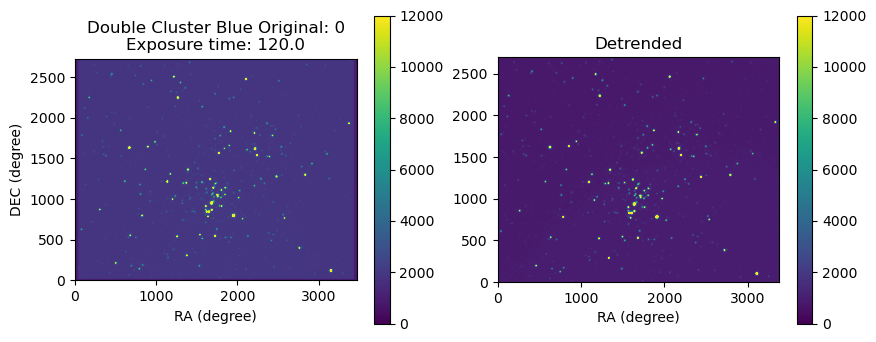

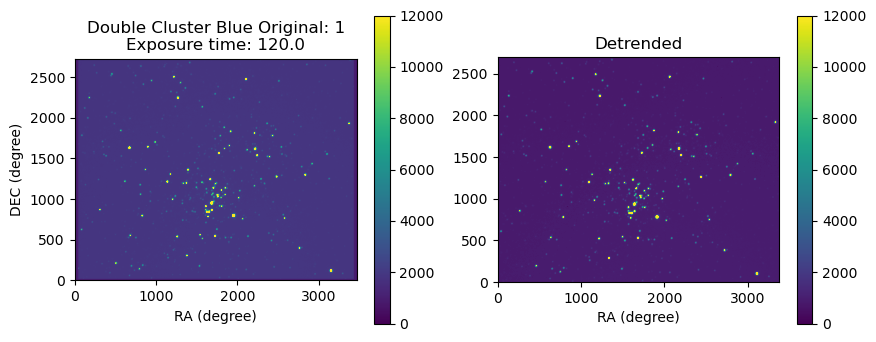

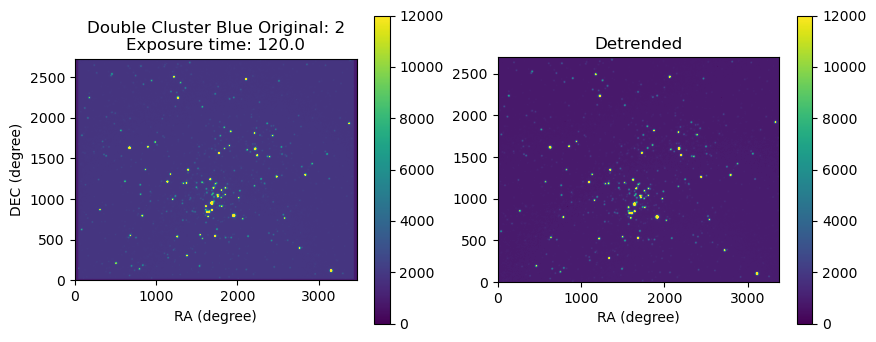

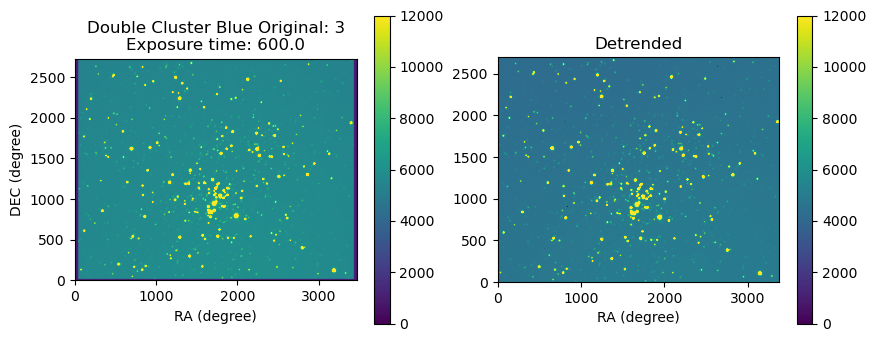

In [68]:
#plot the original vs detrended science Blue images
for i in range(len(detrended_blues)):
    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(scienceb_data[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Double Cluster Blue Original: " + str(i) + "\nExposure time: " + str(scienceb_headers[i]["EXPTIME"]))
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()

    plt.subplot(122)
    plt.imshow(detrended_blues[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Detrended")
    plt.xlabel("RA (degree)")
    plt.colorbar()
    plt.show()

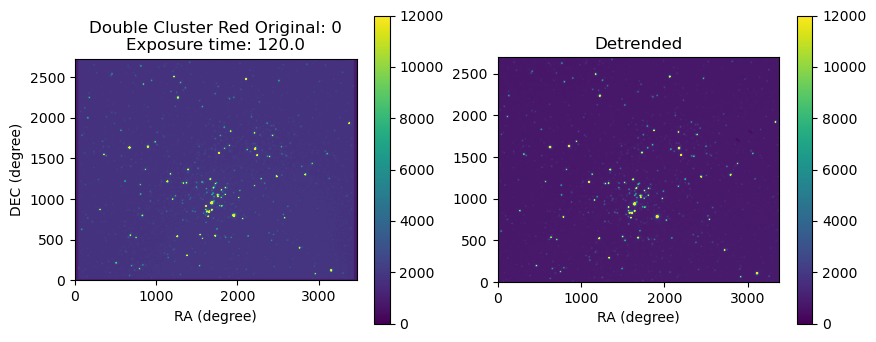

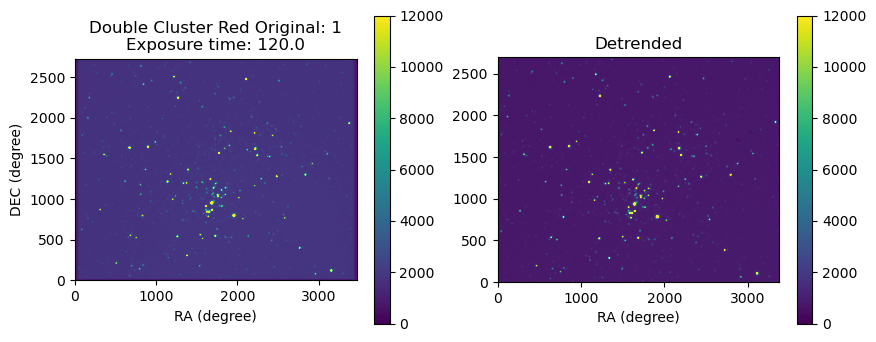

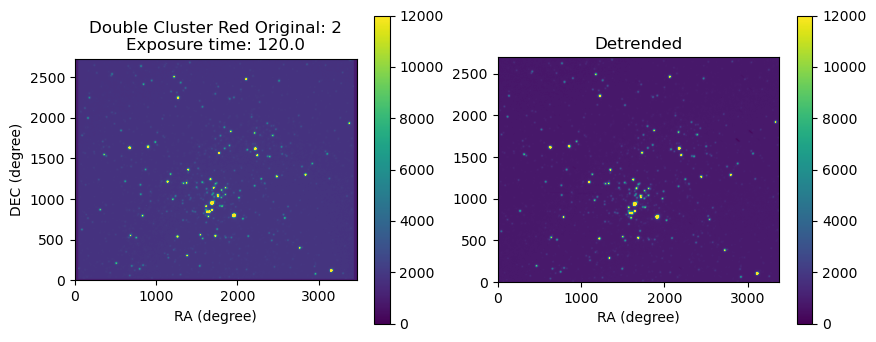

In [69]:
#plot the original vs detrended science Red images
for i in range(len(detrended_reds)):
    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(sciencer_data[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Double Cluster Red Original: " + str(i) + "\nExposure time: " + str(sciencer_headers[i]["EXPTIME"]))
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()

    plt.subplot(122)
    plt.imshow(detrended_reds[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Detrended")
    plt.xlabel("RA (degree)")
    plt.colorbar()
    plt.show()

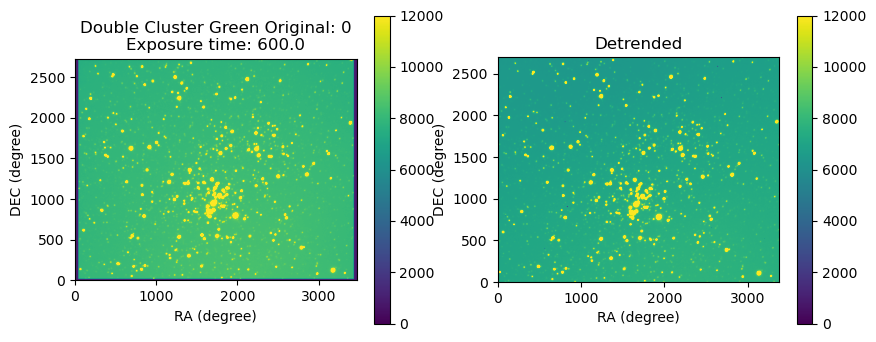

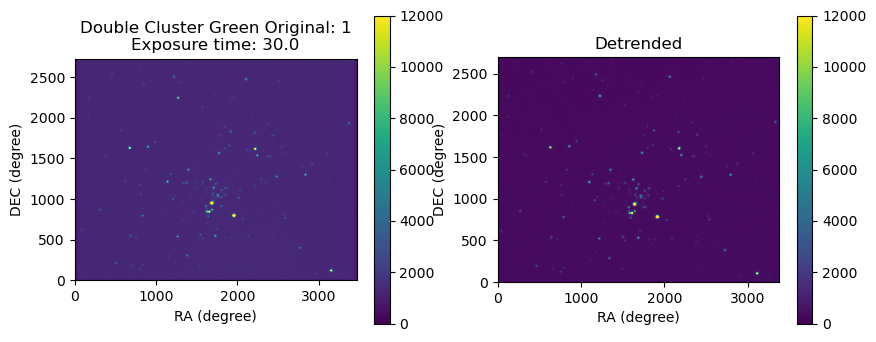

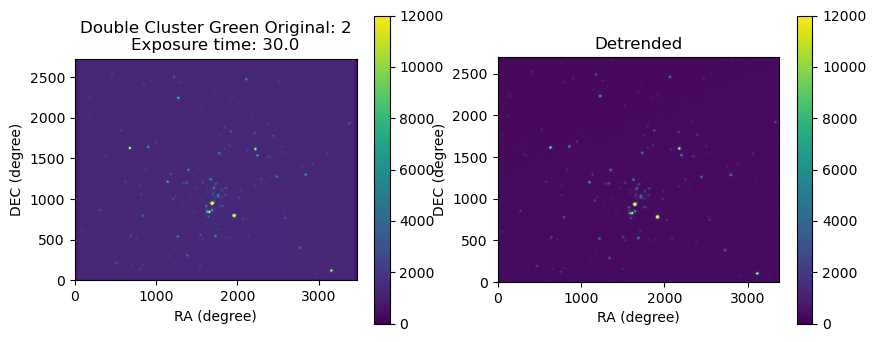

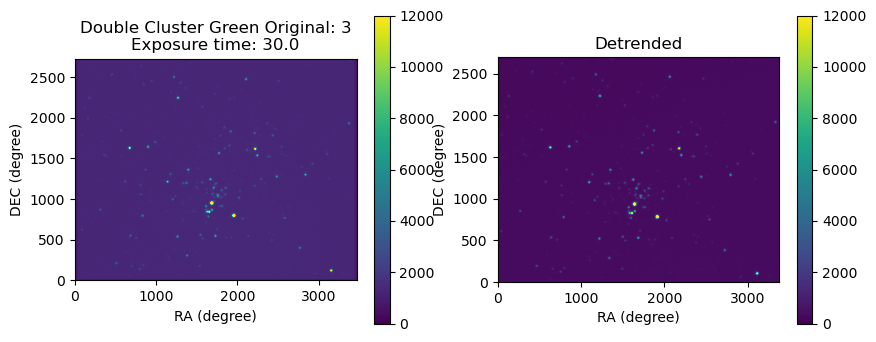

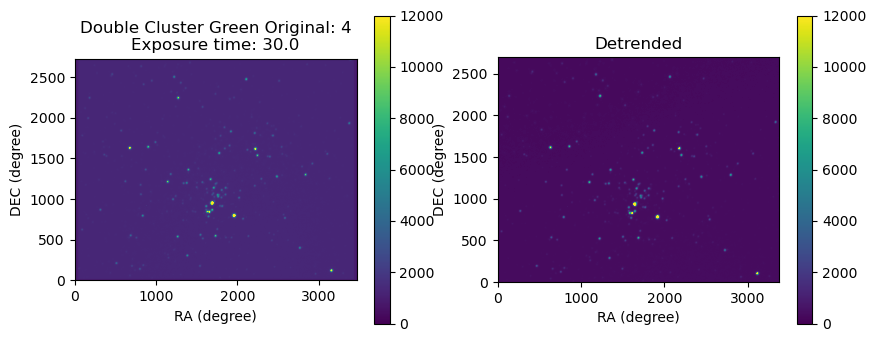

...

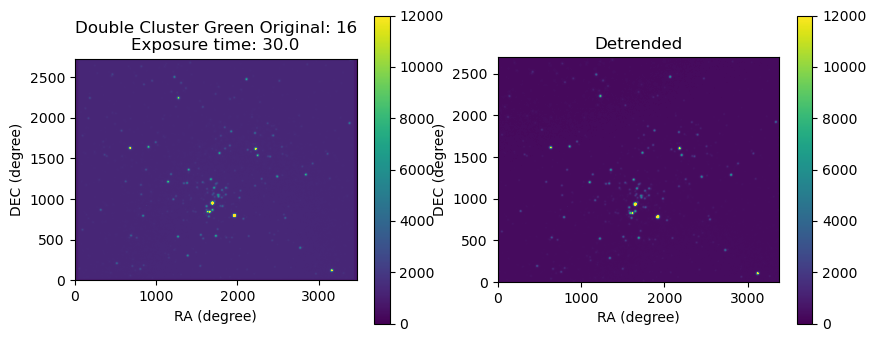

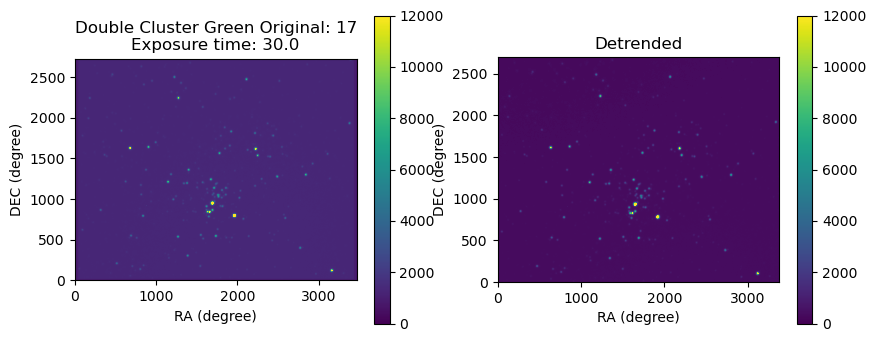

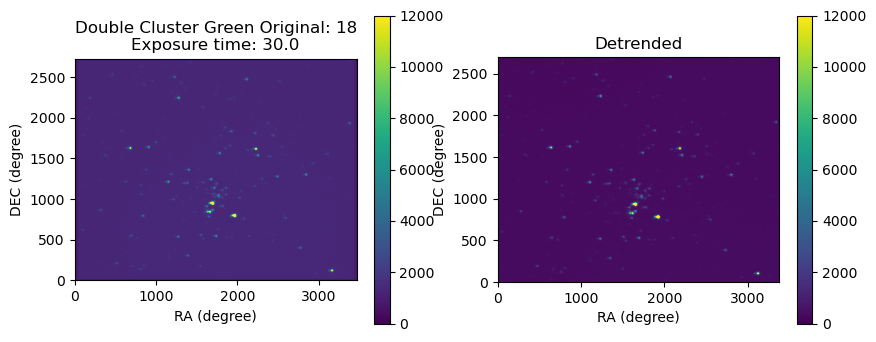

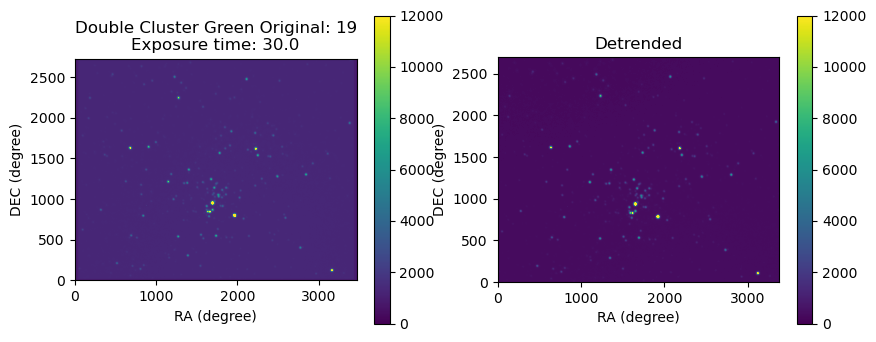

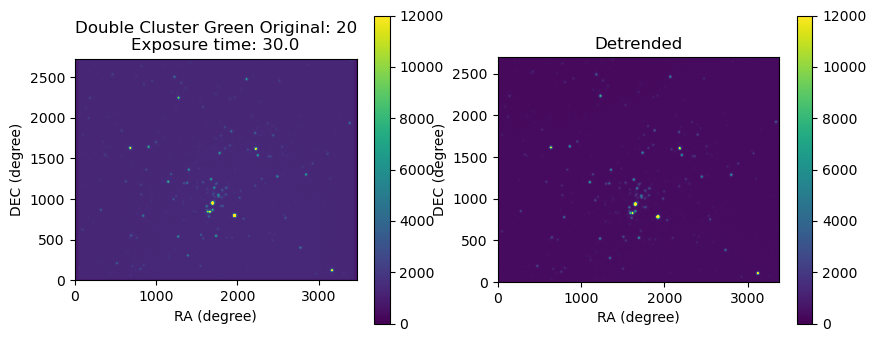

In [42]:
#plot the original vs detrended science Green images
for i in range(len(detrended_greens)):
    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(scienceg_data[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Double Cluster Green Original: " + str(i) + "\nExposure time: " + str(scienceg_headers[i]["EXPTIME"]))
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()

    plt.subplot(122)
    plt.imshow(detrended_greens[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Detrended")
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()
    plt.show()

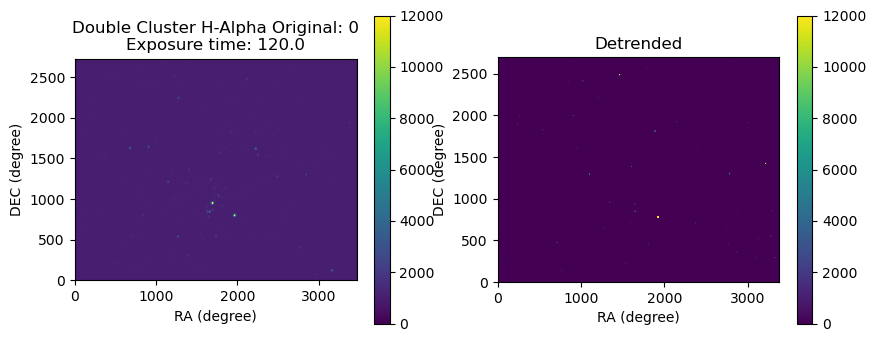

In [43]:
#plot the original vs detrended science H-Alpha images
for i in range(len(detrended_halpha)):
    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(scienceh_data[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Double Cluster H-Alpha Original: " + str(i) + "\nExposure time: " + str(scienceh_headers[i]["EXPTIME"]))
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()

    plt.subplot(122)
    plt.imshow(detrended_halpha[i], vmin=0, vmax=12000, origin='lower')
    plt.title("Detrended")
    plt.xlabel("RA (degree)")
    plt.ylabel("DEC (degree)")
    plt.colorbar()
    plt.show()

# 2. Calibrate WCS
Upload reduced images to astrometry.net to get the correct WCS.

In [4]:
#load in all of the new images with WCS data from astrometry.net
catwcs = ccdlist("C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\WCS Images\\*.fits")

WCSIm_Blue01  3380  2702  Light Frame  120.0  Blue
WCSIm_Blue02  3380  2702  Light Frame  120.0  Blue
WCSIm_Blue03  3380  2702  Light Frame  120.0  Blue
WCSIm_Blue04  3380  2702  Light Frame  600.0  Blue
WCSIm_Green01  3380  2702  Light Frame  600.0  Green
WCSIm_Green02  3380  2702  Light Frame  30.0  Green
WCSIm_Green03  3380  2702  Light Frame  30.0  Green
WCSIm_Green04  3380  2702  Light Frame  30.0  Green
WCSIm_Green05  3380  2702  Light Frame  30.0  Green
WCSIm_Green06  3380  2702  Light Frame  30.0  Green
WCSIm_Green07  3380  2702  Light Frame  30.0  Green
WCSIm_Green08  3380  2702  Light Frame  30.0  Green
WCSIm_Green09  3380  2702  Light Frame  30.0  Green
WCSIm_Green10  3380  2702  Light Frame  30.0  Green
WCSIm_Green11  3380  2702  Light Frame  30.0  Green
WCSIm_Green12  3380  2702  Light Frame  30.0  Green
WCSIm_Green13  3380  2702  Light Frame  30.0  Green
WCSIm_Green14  3380  2702  Light Frame  30.0  Green
WCSIm_Green15  3380  2702  Light Frame  30.0  Green
WCSIm_Green16  

Astrometry.net could not find the WCS match for the H-Alpha image

In [129]:
#load in new science Blue images
ind12, = np.where(catwcs['filter']=="Blue")
detrendwcs_blue_files = catwcs['file'][ind12]
detrendwcs_blue_data = []
detrendwcs_blue_headers = []

for i in range(len(detrendwcs_blue_files)):
    detrendwcs_blue_image = fits.getdata(detrendwcs_blue_files[i], 0, header=True)
    detrendwcs_blue_data.append(detrendwcs_blue_image[0])
    detrendwcs_blue_headers.append(detrendwcs_blue_image[1])
    
#load in new science Green images  
ind13, = np.where(catwcs['filter']=="Green")
detrendwcs_green_files = catwcs['file'][ind13]
detrendwcs_green_data = []
detrendwcs_green_headers = []

for i in range(len(detrendwcs_green_files)):
    detrendwcs_green_image = fits.getdata(detrendwcs_green_files[i], 0, header=True)
    detrendwcs_green_data.append(detrendwcs_green_image[0])
    detrendwcs_green_headers.append(detrendwcs_green_image[1])
    
#load in new science Red images   
ind14, = np.where(catwcs['filter']=="Red")
detrendwcs_red_files = catwcs['file'][ind14]
detrendwcs_red_data = []
detrendwcs_red_headers = []

for i in range(len(detrendwcs_red_files)):
    detrendwcs_red_image = fits.getdata(detrendwcs_red_files[i], 0, header=True)
    detrendwcs_red_data.append(detrendwcs_red_image[0])
    detrendwcs_red_headers.append(detrendwcs_red_image[1])

In [87]:
detrendwcs_blue_headers[b]

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 3380                                                  
NAXIS2  =                 2702                                                  
DATE-OBS= '2020-02-22T05:02:18' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   600.00000000000000 /Exposure time in seconds                        
EXPOSURE=   600.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -20.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -20.049999237060547 /CCD temperature at start of exposure in C       
XPIXSZ  =   3.6899999999999999 /Pixel Width in microns (after binning)          
YPIXSZ  =   3.6899999999999999 /Pixel Height in microns (after binning)         
XBINNING=                   

# 3. Perform photometry
Aperture photometry or PSF photometry with Prometheus.

In [7]:
#DO NOT RUN AGAIN
#run photometry on all of the images
outb = []
modelb = []
skyb = []
psfb = []

for i in range(len(detrendwcs_blue_data)):
    ccddata = CCDData(detrendwcs_blue_data[i])
    out,model,sky,psf = prometheus.run(ccddata,'penny',verbose=True, ndetsigma=3)
    outb.append(out)
    modelb.append(model)
    skyb.append(sky)
    psfb.append(psf)
    print("**Photometry done for Blue Image ", i, "**")
    
    
outg = []
modelg = []
skyg = []
psfg = []

for i in range(len(detrendwcs_green_data)):
    ccddata = CCDData(detrendwcs_green_data[i])
    out,model,sky,psf = prometheus.run(ccddata,'penny',verbose=True, ndetsigma=3)
    outg.append(out)
    modelg.append(model)
    skyg.append(sky)
    psfg.append(psf)
    print("**Photometry done for Green Image ", i, "**")
    
    
outr = []
modelr = []
skyr = []
psfr = []

for i in range(len(detrendwcs_red_data)):
    ccddata = CCDData(detrendwcs_red_data[i])
    out,model,sky,psf = prometheus.run(ccddata,'penny',verbose=True, ndetsigma=3)
    outr.append(out)
    modelr.append(model)
    skyr.append(sky)
    psfr.append(psf)
    print("**Photometry done for Red Image ", i, "**")

Image shape  (2702, 3380)
Step 1: Detection
Detection method = sep
Nsigma =  3.00
1572 objects detected
Step 2: Aperture photometry
Min/Max mag:  8.38, 16.07
1572 objects left after S/N=  5.0 cut
Step 3: Construct the PSF
FWHM =  8.99 pixels (770 sources)
100 PSF stars found
Final PSF: PSFPenny([5.515567032470321, 4.979407968354233, 1.0805590640011946, 0.3706804578537902, 3.9400976147038484],binned=False,npix=51,lookup=False) FWHM=10.44
Median RMS:  0.0453
Step 4: Get PSF photometry for all 1572 objects
dt = 82.80 sec
**Photometry done for Blue Image  0 **
Image shape  (2702, 3380)
Step 1: Detection
Detection method = sep
Nsigma =  3.00
1603 objects detected
Step 2: Aperture photometry
Min/Max mag:  8.42, 15.95
1603 objects left after S/N=  5.0 cut
Step 3: Construct the PSF
FWHM =  8.81 pixels (817 sources)
100 PSF stars found
Final PSF: PSFPenny([5.543086751253141, 4.921813468284536, 1.1568308802192413, 0.34219570501315655, 3.0352808253053176],binned=False,npix=51,lookup=False) FWHM=9

Final PSF: PSFPenny([4.152796046272581, 3.5394455965152187, 0.26853126244438535, 0.2, 6.0],binned=False,npix=51,lookup=False) FWHM=9.50
Median RMS:  0.3145
Step 4: Get PSF photometry for all 1573 objects
dt = 24.48 sec
**Photometry done for Green Image  10 **
Image shape  (2702, 3380)
Step 1: Detection
Detection method = sep
Nsigma =  3.00
1486 objects detected
Step 2: Aperture photometry
Min/Max mag:  9.96, 17.23
1486 objects left after S/N=  5.0 cut
Step 3: Construct the PSF
FWHM =  9.48 pixels (475 sources)
100 PSF stars found
Final PSF: PSFPenny([4.2256402643233, 3.7205142353938916, 0.20691448051706332, 0.2, 6.0],binned=False,npix=51,lookup=False) FWHM=9.72
Median RMS:  0.2263
Step 4: Get PSF photometry for all 1486 objects
dt = 25.29 sec
**Photometry done for Green Image  11 **
Image shape  (2702, 3380)
Step 1: Detection
Detection method = sep
Nsigma =  3.00
1601 objects detected
Step 2: Aperture photometry
Min/Max mag: 10.09, 17.28
1601 objects left after S/N=  5.0 cut
Step 3: Co

In [8]:
#DO NOT RUN AGAIN
#save all of the photometry models to my laptop
for i in range(len(modelb)):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_B" + str(i+1) + ".fit"
    im = modelb[i].data
    fits.writeto(n, im, overwrite=True)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_B" + str(i+1) + ".fit"
    im1 = skyb[i].data
    fits.writeto(n1, im1, overwrite=True)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_B" + str(i+1) + ".fit"
    tab2 = outb[i]
    tab2.write(n2, overwrite=True)
    
    
for i in range(len(modelg)):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_G" + str(i+1) + ".fit"
    im = modelg[i].data
    fits.writeto(n, im, overwrite=True)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_G" + str(i+1) + ".fit"
    im1 = skyg[i].data
    fits.writeto(n1, im1, overwrite=True)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_G" + str(i+1) + ".fit"
    tab2 = outg[i]
    tab2.write(n2, overwrite=True)
    
for i in range(len(modelr)):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_R" + str(i+1) + ".fit"
    im = modelr[i].data
    fits.writeto(n, im, overwrite=True)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_R" + str(i+1) + ".fit"
    im1 = skyr[i].data
    fits.writeto(n1, im1, overwrite=True)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_R" + str(i+1) + ".fit"
    tab2 = outr[i]
    tab2.write(n2, overwrite=True)

In [6]:
#RUN TO GET PHOTOMETRY MODELS
#load in photometry models from computer
outb = []
modelb = []
skyb = []
psfb = []

for i in range(4):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_B" + str(i+1) + ".fit"
    im = fits.getdata(n)
    modelb.append(im)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_B" + str(i+1) + ".fit"
    im1 = fits.getdata(n1)
    skyb.append(im1)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_B" + str(i+1) + ".fit"
    tab2 = Table.read(n2)
    outb.append(tab2)    
    
outg = []
modelg = []
skyg = []
psfg = []
    
for i in range(21):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_G" + str(i+1) + ".fit"
    im = fits.getdata(n)
    modelg.append(im)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_G" + str(i+1) + ".fit"
    im1 = fits.getdata(n1)
    skyg.append(im1)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_G" + str(i+1) + ".fit"
    tab2 = Table.read(n2)
    outg.append(tab2)
       
outr = []
modelr = []
skyr = []
psfr = []
    
for i in range(3):
    n = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Models\\PSF_Phot_R" + str(i+1) + ".fit"
    im = fits.getdata(n)
    modelr.append(im)
    
    n1 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Skys\\PSF_Phot_R" + str(i+1) + ".fit"
    im1 = fits.getdata(n1)
    skyr.append(im1)
    
    n2 = "C:\\Users\\Sarah\\Jupyter Notebooks\\ASTR 475\\Final Project\\Photometry_Results\\Outs\\PSF_Phot_R" + str(i+1) + ".fit"
    tab2 = Table.read(n2)
    outr.append(tab2)

In [7]:
#choose which science image in each filter is the "best"
#look at the mean semi-major and semi-minor axes to figure out which exposure is the most in focus
asemi_meanb = []
bsemi_meanb = []

for i in range(len(outb)):
    asemi_meanb.append(np.mean(outb[i]["asemi"]))
    bsemi_meanb.append(np.mean(outb[i]["bsemi"]))

    
asemi_meang = []
bsemi_meang = []

for i in range(len(outg)):
    asemi_meang.append(np.mean(outg[i]["asemi"]))
    bsemi_meang.append(np.mean(outg[i]["bsemi"]))
    
asemi_meanr = []
bsemi_meanr = []

for i in range(len(outr)):
    asemi_meanr.append(np.mean(outr[i]["asemi"]))
    bsemi_meanr.append(np.mean(outr[i]["bsemi"]))
    
#print(asemi_meanb) #4th model has lowest axes-means (index=3)
#print(bsemi_meanb)
#print(asemi_meang) #16th model has lowest axes-means (index=15)
#print(bsemi_meang)
#print(asemi_meanr) #3rd model has lowest axes-means (index=2)
#print(bsemi_meanr)

#create index values for the best images for later reference
b = 3
g = 15
r = 2

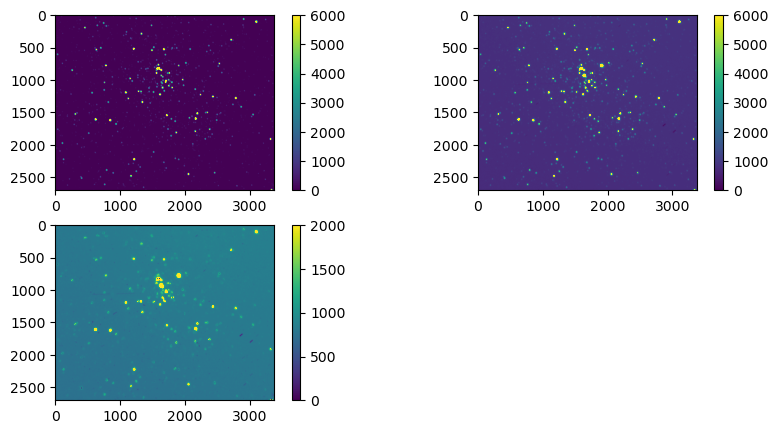

In [141]:
#look at how well the model fits the original image
plt.figure(figsize=(10,5))
plt.subplot(221)
plt.imshow(modelr[r], vmin = 0, vmax=6000)
plt.colorbar()

plt.subplot(222)
plt.imshow(detrendwcs_red_data[r], vmin = 0, vmax=6000)
plt.colorbar()

plt.subplot(223)
plt.imshow(detrendwcs_red_data[r]-modelr[r], vmin=0, vmax=2000)
plt.colorbar()

# 4. Photometric Calibration
Cross-match the stars with Gaia DR3 and determine the photometric zeropoint.

In [8]:
ps1 = Table.read('doublecluster_ps1_v2.fits.gz')

In [9]:
#find ra and dec coordinates for best blue, green, and red images
pixb = outb[b][["xpeak","ypeak"]]
wb = WCS(detrendwcs_blue_headers[b])
worldb = wb.wcs_pix2world(pixb["xpeak"], pixb["ypeak"], 1)  
outb[b]['ra'] = worldb[0]
outb[b]['dec'] = worldb[1]
    
pixg = outg[g][["xpeak","ypeak"]]
wg = WCS(detrendwcs_green_headers[g])
worldg = wg.wcs_pix2world(pixg["xpeak"], pixg["ypeak"], 1)
outg[g]['ra'] = worldg[0]
outg[g]['dec'] = worldg[1]

pixr = outr[r][["xpeak","ypeak"]]
wr = WCS(detrendwcs_red_headers[r])
worldr = wr.wcs_pix2world(pixr["xpeak"], pixr["ypeak"], 1)   
outr[r]['ra'] = worldr[0]
outr[r]['dec'] = worldr[1]

In [10]:
#crossmatch best blue, red, green images
ps1_indb, model_indb, distb = coords.xmatch(ps1['ra'], ps1['dec'], outb[b]['ra'], outb[b]['dec'], 1.0)
ps1_indg, model_indg, distg = coords.xmatch(ps1['ra'], ps1['dec'], outg[g]['ra'], outg[g]['dec'], 1.0)
ps1_indr, model_indr, distr = coords.xmatch(ps1['ra'], ps1['dec'], outr[r]['ra'], outr[r]['dec'], 1.0)

In [11]:
#Crossmatch all Blue images
worldb = []
ps1_indsb = []
model_ps1_indsb = []

for i in range(len(outb)):
    pix = outb[i][["xpeak","ypeak"]]
    w = WCS(detrendwcs_blue_headers[i])
    world = w.wcs_pix2world(pix["xpeak"], pix["ypeak"], 1)
    worldb.append(world)
    outb[i]['ra'] = world[0]
    outb[i]['dec'] = world[1]
    
    ps1_indb, model_indb, distb = coords.xmatch(ps1['ra'],ps1['dec'],world[0],world[1],1.0)
    
    ps1_indsb.append(ps1_indb)
    model_ps1_indsb.append(model_indb)

    
#Crossmatch all Green images 
worldg = []
ps1_indsg = []
model_ps1_indsg = []

for i in range(len(outg)):
    pix = outg[i][["xpeak","ypeak"]]
    w = WCS(detrendwcs_green_headers[i])
    world = w.wcs_pix2world(pix["xpeak"], pix["ypeak"], 1)
    worldg.append(world)
    outg[i]['ra'] = world[0]
    outg[i]['dec'] = world[1]
    
    ps1_indg, model_indg, distg = coords.xmatch(ps1['ra'],ps1['dec'],world[0],world[1],1.0)
    
    ps1_indsg.append(ps1_indg)
    model_ps1_indsg.append(model_indg)
    
    
#Crossmatch all Red images
worldr = []
ps1_indsr = []
model_ps1_indsr = []

for i in range(len(outr)):
    pix = outr[i][["xpeak","ypeak"]]
    w = WCS(detrendwcs_red_headers[i])
    world = w.wcs_pix2world(pix["xpeak"], pix["ypeak"], 1)
    worldr.append(world)
    outr[i]['ra'] = world[0]
    outr[i]['dec'] = world[1]
    
    ps1_indr, model_indr, distr = coords.xmatch(ps1['ra'],ps1['dec'],world[0],world[1],1.0)
    
    ps1_indsr.append(ps1_indr)
    model_ps1_indsr.append(model_indr)

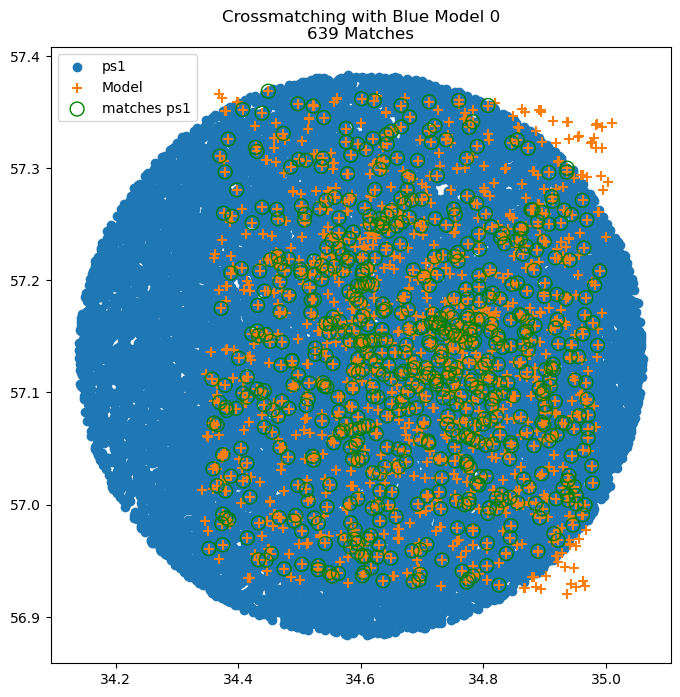

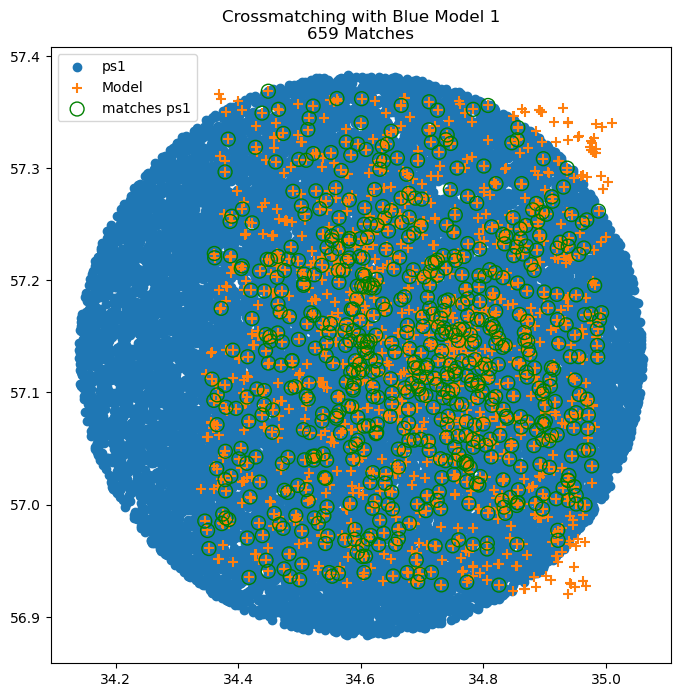

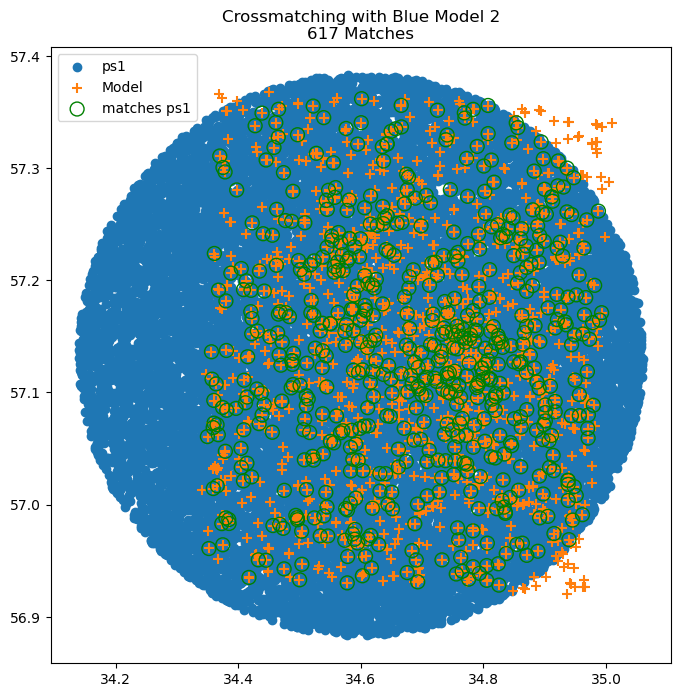

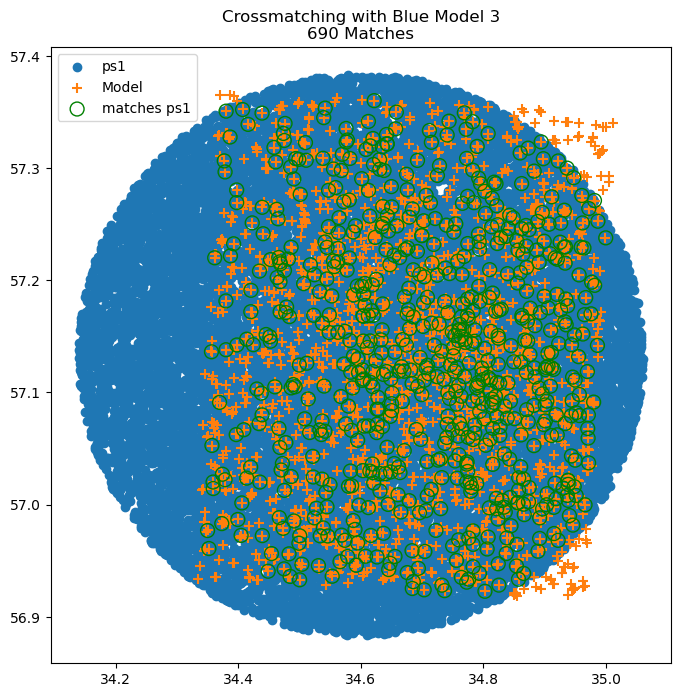

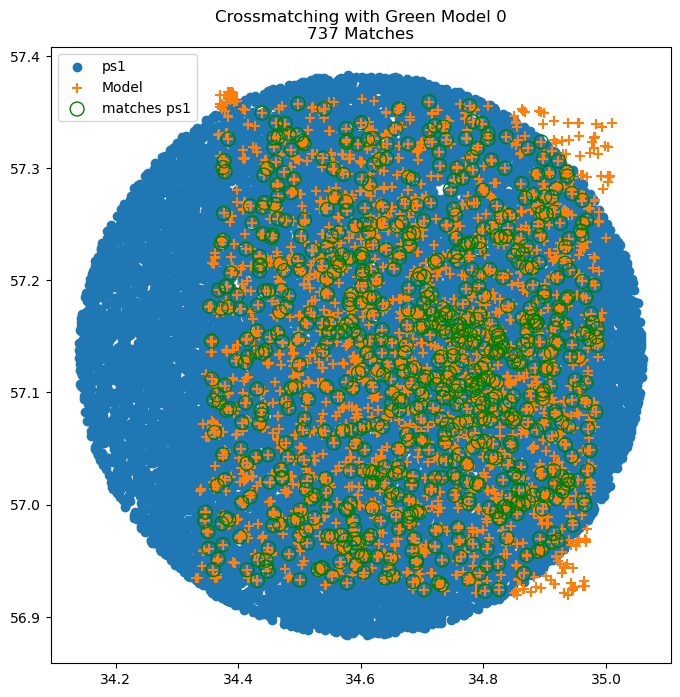

...

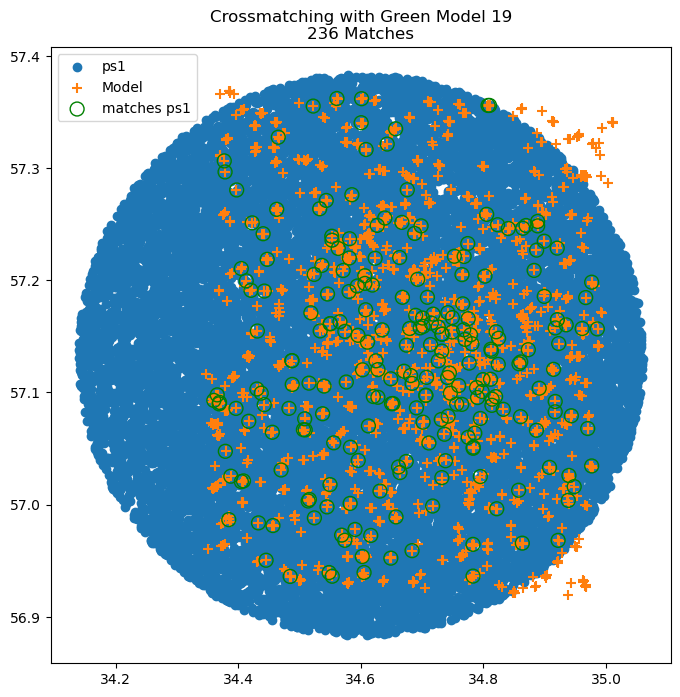

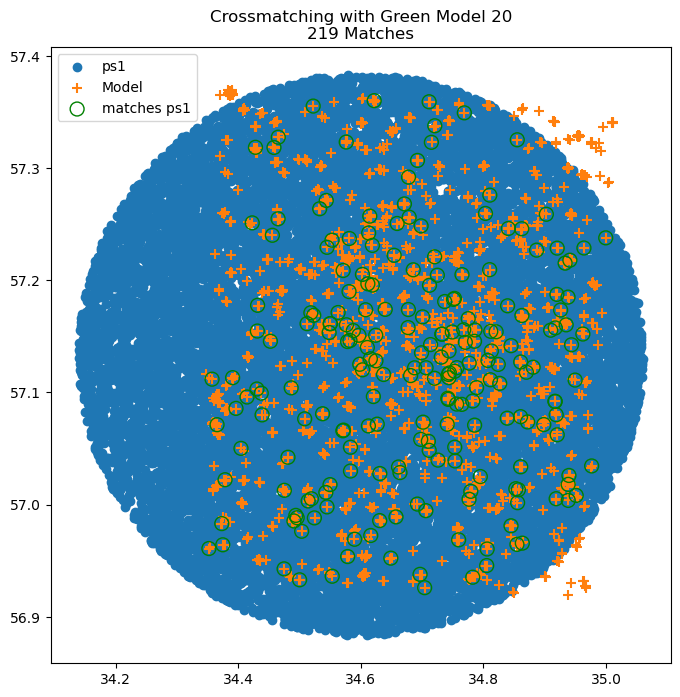

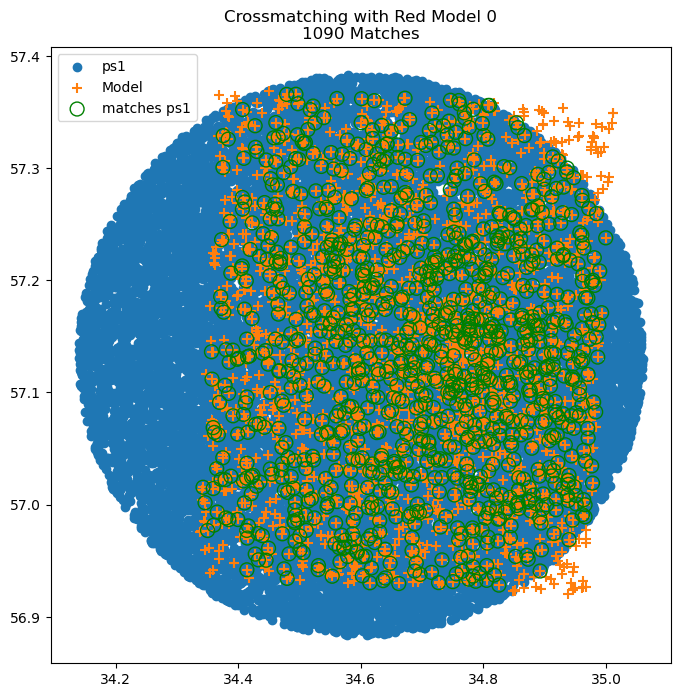

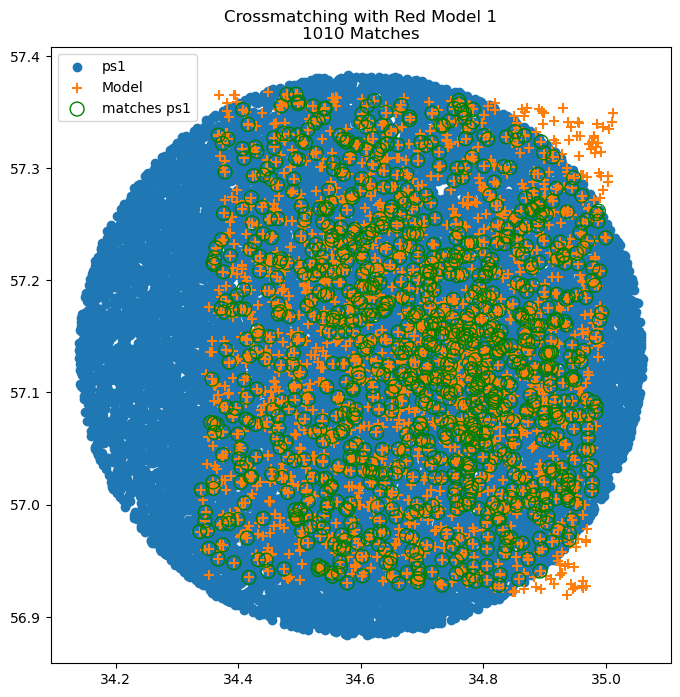

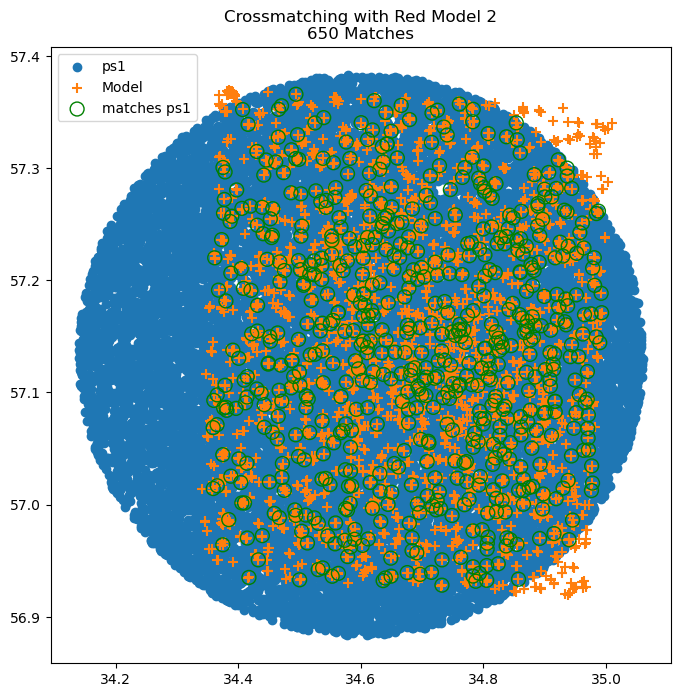

In [12]:
#try plotting all the blue crossmatch images
for i in range(len(modelb)):
    fig = plt.figure(figsize=(8,8))
    plt.title("Crossmatching with Blue Model " + str(i) + "\n" + str(len(ps1_indsb[i])) + " Matches")
    plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
    plt.scatter(worldb[i][0],worldb[i][1],marker='+',s=50,label='Model')
    plt.scatter(ps1['ra'][ps1_indsb[i]],ps1['dec'][ps1_indsb[i]],marker='o',facecolors='none',edgecolors='green',s=100,label='matches ps1')
    #plt.scatter(worldb[i][0][model_ps1_indsb[i]],worldb[i][1][model_ps1_indsb[i]],marker='o',facecolors='none',edgecolors='red',s=100,label='matches model')
    plt.legend()
    plt.show()
    
#try plotting all the green crossmatch images
for i in range(len(modelg)):
    fig = plt.figure(figsize=(8,8))
    plt.title("Crossmatching with Green Model " + str(i) + "\n" + str(len(ps1_indsg[i])) + " Matches")
    plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
    plt.scatter(worldg[i][0],worldg[i][1],marker='+',s=50,label='Model')
    plt.scatter(ps1['ra'][ps1_indsg[i]],ps1['dec'][ps1_indsg[i]],marker='o',facecolors='none',edgecolors='green',s=100,label='matches ps1')
    #plt.scatter(worldg[i][0][model_ps1_indsg[i]],worldg[i][1][model_ps1_indsg[i]],marker='o',facecolors='none',edgecolors='red',s=100,label='matches model')
    plt.legend()
    plt.show()
    
#try plotting all the red crossmatch images
for i in range(len(modelr)):
    fig = plt.figure(figsize=(8,8))
    plt.title("Crossmatching with Red Model " + str(i) + "\n" + str(len(ps1_indsr[i])) + " Matches")
    plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
    plt.scatter(worldr[i][0],worldr[i][1],marker='+',s=50,label='Model')
    plt.scatter(ps1['ra'][ps1_indsr[i]],ps1['dec'][ps1_indsr[i]],marker='o',facecolors='none',edgecolors='green',s=100,label='matches ps1')
    #plt.scatter(worldr[i][0][model_ps1_indsr[i]],worldr[i][1][model_ps1_indsr[i]],marker='o',facecolors='none',edgecolors='red',s=100,label='matches model')
    plt.legend()
    plt.show()

In [13]:
#now crossmatch the best red and blue images as well
#ps1_blue_best = ps1[ps1_indsb[b]] #ps1 catalogue of stars matched with the Blue filter
#ps1_red_best = ps1[ps1_indsr[r]] #ps1 catalogue of stars matched with the Red filter
ps1_blue_best = ps1[ps1_indb]
ps1_red_best = ps1[ps1_indr]

#model_blue_best1 = outb[b][model_ps1_indsb[b]] #blue model catalogue of stars matched with ps1
#model_red_best1 = outr[r][model_ps1_indsr[r]] #red model catalogue of stars matched with ps1
model_blue_best = outb[b][model_indb]
model_red_best = outr[r][model_indr]

#crossmatch the 2 ps1 catalogues above
ps1_ball_inds, ps1_rall_inds, dist4 = coords.xmatch(ps1_blue_best['ra'], ps1_blue_best['dec'], ps1_red_best['ra'], ps1_red_best['dec'], 1.0)

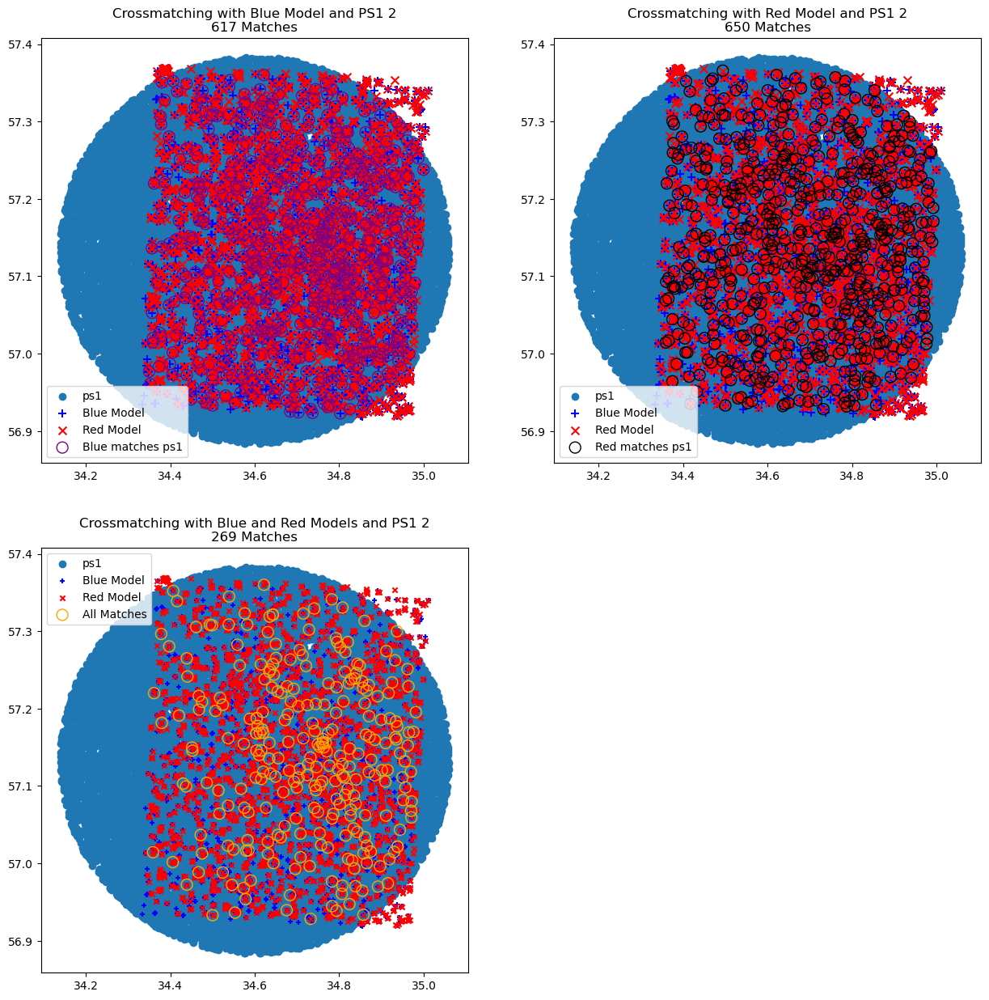

In [21]:
#Plot the best Blue and Red images against the ps1 catalogue
fig = plt.figure(figsize=(15,15))
plt.subplot(221)
plt.title("Crossmatching with Blue Model and PS1 " + str(i) + "\n" + str(len(ps1_indsb[i])) + " Matches")
plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
plt.scatter(worldb[b][0],worldb[b][1],marker='+',s=50,c="blue", label='Blue Model')
plt.scatter(worldr[r][0], worldr[r][1], marker='x', s=50,c="red", label="Red Model")
plt.scatter(ps1['ra'][ps1_indsb[b]],ps1['dec'][ps1_indsb[b]],marker='o',facecolors='none',edgecolors="purple",s=100,label='Blue matches ps1')
plt.legend()

plt.subplot(222)
plt.title("Crossmatching with Red Model and PS1 " + str(i) + "\n" + str(len(ps1_indsr[i])) + " Matches")
plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
plt.scatter(worldb[b][0],worldb[b][1],marker='+',s=50,c="blue", label='Blue Model')
plt.scatter(worldr[r][0], worldr[r][1], marker='x', s=50,c="red", label="Red Model")
plt.scatter(ps1['ra'][ps1_indsr[r]],ps1['dec'][ps1_indsr[r]],marker='o',facecolors='none',edgecolors="black",s=100,label='Red matches ps1')
plt.legend()

plt.subplot(223)
plt.title("Crossmatching with Blue and Red Models and PS1 " + str(i) + "\n" + str(len(ps1_ball_inds)) + " Matches")
plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
plt.scatter(worldb[b][0],worldb[b][1],marker='+',s=20,c="blue", label='Blue Model')
plt.scatter(worldr[r][0], worldr[r][1], marker='x', s=20,c="red", label="Red Model")
plt.scatter(ps1_blue_best['ra'][ps1_ball_inds],ps1_blue_best['dec'][ps1_ball_inds], marker='o',facecolors='none',edgecolors="orange",s=100,label='All Matches')
#plt.scatter(worldb[i][0][model_ps1_indsb[i]],worldb[i][1][model_ps1_indsb[i]],marker='o',facecolors='none',edgecolors='red',s=100,label='matches model')
plt.legend()
plt.show()

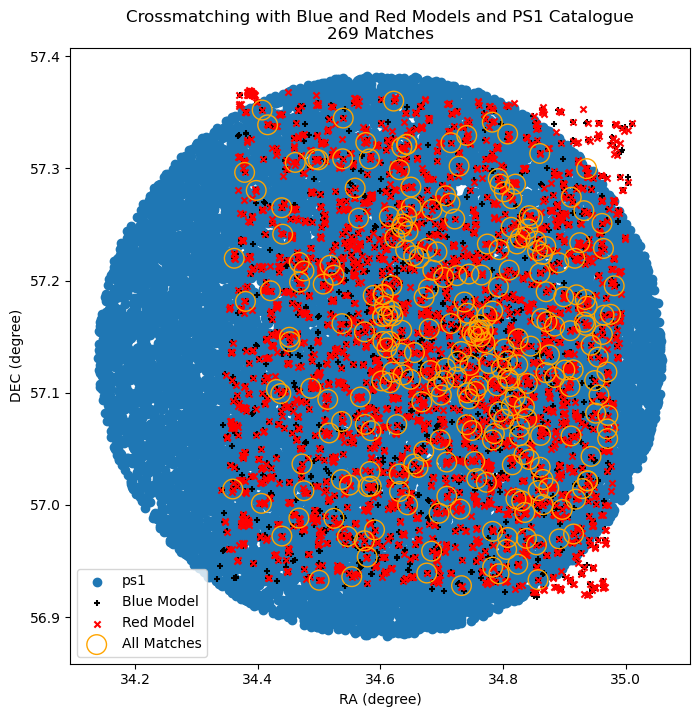

In [84]:
plt.figure(figsize=(8,8))
plt.title("Crossmatching with Blue and Red Models and PS1 Catalogue" +  "\n" + str(len(ps1_ball_inds)) + " Matches")
plt.xlabel("RA (degree)")
plt.ylabel("DEC (degree)")
plt.scatter(ps1['ra'],ps1['dec'],marker='o',label='ps1')
plt.scatter(worldb[b][0],worldb[b][1],marker='+',s=20,c="black", label='Blue Model')
plt.scatter(worldr[r][0], worldr[r][1], marker='x', s=20,c="red", label="Red Model")
plt.scatter(ps1_blue_best['ra'][ps1_ball_inds],ps1_blue_best['dec'][ps1_ball_inds], marker='o',facecolors='none',edgecolors="orange",s=200,label='All Matches')
#plt.scatter(worldb[i][0][model_ps1_indsb[i]],worldb[i][1][model_ps1_indsb[i]],marker='o',facecolors='none',edgecolors='red',s=100,label='matches model')
plt.legend()
plt.show()

In [48]:
#final catalogue of ps1 stars that have been crossmatched
final_ps1_stars = ps1_blue_best[ps1_ball_inds]

#create red and blue final catalogues
model_bfinal_inds, ps1_5, dist5 = coords.xmatch(model_blue_best['ra'], model_blue_best['dec'], final_ps1_stars['ra'], final_ps1_stars['dec'], 1.0)
model_rfinal_inds, ps1_6, dist6 = coords.xmatch(model_red_best['ra'], model_red_best['dec'], final_ps1_stars['ra'], final_ps1_stars['dec'], 1.0)

final_blue_stars = model_blue_best[model_bfinal_inds]
final_ps1b_stars = final_ps1_stars[ps1_5]

final_red_stars = model_red_best[model_rfinal_inds]
final_ps1r_stars = final_ps1_stars[ps1_6]

In [49]:
# true_mag = instrumental_mag + a0
#try finding zero-point offset by looking at the differences between each star's catalogued and observed magnitude
#in each color and then find the median difference (not mean since there are lots of spikes and outliers)
#allow for different offset for blue vs red filters

#use psfmag since we are using psf_photometry

In [50]:
bmag_diff = final_ps1b_stars['gmag'] - final_blue_stars['psfmag']
rmag_diff = final_ps1r_stars['rmag'] - final_red_stars['psfmag']

In [51]:
b_offset = np.median(bmag_diff)
r_offset = np.median(rmag_diff)
print("blue median offset:", b_offset)
print("Red median offset:", r_offset)

blue median offset: 4.112027885931887
Red median offset: 2.0189606991121707


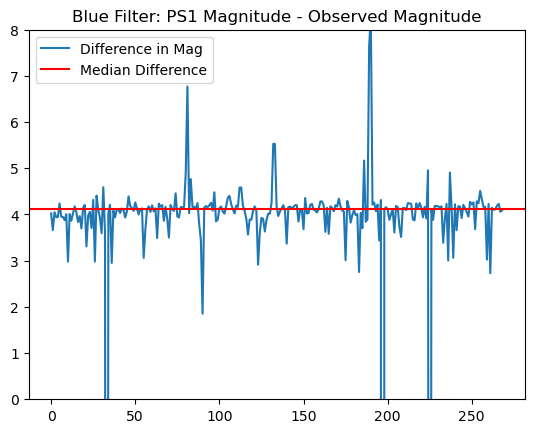

In [75]:
#plot the differences between catalogue and observed magnitudes for the Blue filter
plt.plot(bmag_diff, label="Difference in Mag")
plt.ylim(0,8)
plt.axhline(b_offset, color="red", label="Median Difference")
plt.title("Blue Filter: PS1 Magnitude - Observed Magnitude")
plt.legend()

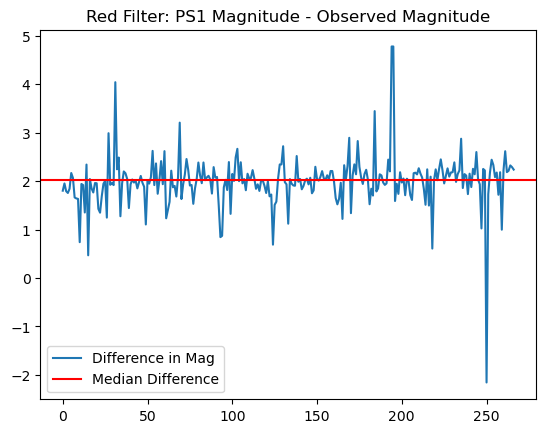

In [74]:
#plot the differences between catalogue and observed magnitudes for the Red filter
plt.plot(rmag_diff, label="Difference in Mag")
plt.axhline(r_offset, color="red", label="Median Difference")
plt.title("Red Filter: PS1 Magnitude - Observed Magnitude")
plt.legend()

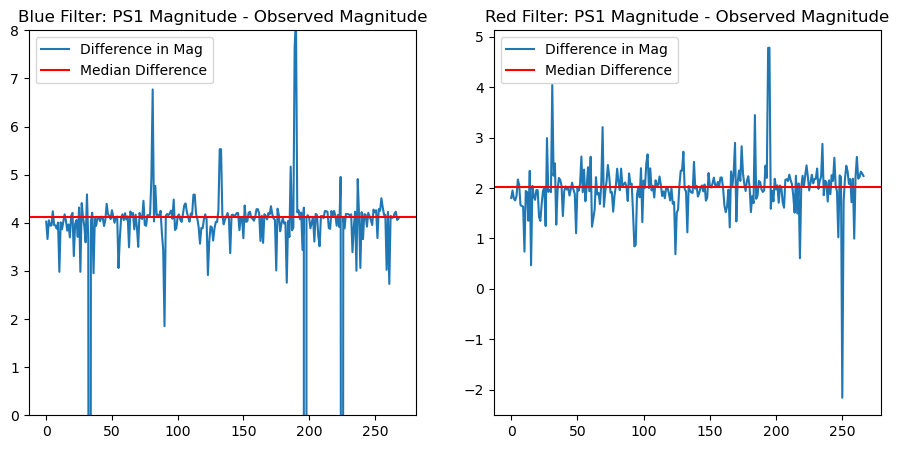

In [76]:
plt.figure(figsize=(11,5))
plt.subplot(121)
#plot the differences between catalogue and observed magnitudes for the Blue filter
plt.plot(bmag_diff, label="Difference in Mag")
plt.ylim(0,8)
plt.axhline(b_offset, color="red", label="Median Difference")
plt.title("Blue Filter: PS1 Magnitude - Observed Magnitude")
plt.legend()

plt.subplot(122)
#plot the differences between catalogue and observed magnitudes for the Red filter
plt.plot(rmag_diff, label="Difference in Mag")
plt.axhline(r_offset, color="red", label="Median Difference")
plt.title("Red Filter: PS1 Magnitude - Observed Magnitude")
plt.legend()

In [54]:
#add in the zero-point offset term to our instrumental magnitudes to create the "calibrated magnitudes"
outb[b]['b_mag_calib'] = outb[b]['psfmag'] + b_offset
outr[r]['r_mag_calib'] = outr[r]['psfmag'] + r_offset

In [55]:
#crossmatch the blue and red filters to get the stars in the same order
blue_final_inds, red_final_inds, dist7 = coords.xmatch(outb[b]['ra'], outb[b]['dec'], outr[r]['ra'], outr[r]['dec'], 1.0)

#final tables of crossmatched and magnitude-corrected blue and red filters
blue_final = outb[b][blue_final_inds]
red_final = outr[r][red_final_inds]

In [56]:
#add the opposite filter's calibrated magnitudes to both filters (so all data is in a single table)
blue_final['r_mag_calib'] = red_final['r_mag_calib']
red_final['b_mag_calib'] = blue_final['b_mag_calib']

# 5. Make Color Magnitude Diagram

Text(0.5, 1.0, 'Double Cluster Color-Magnitude Diagram')

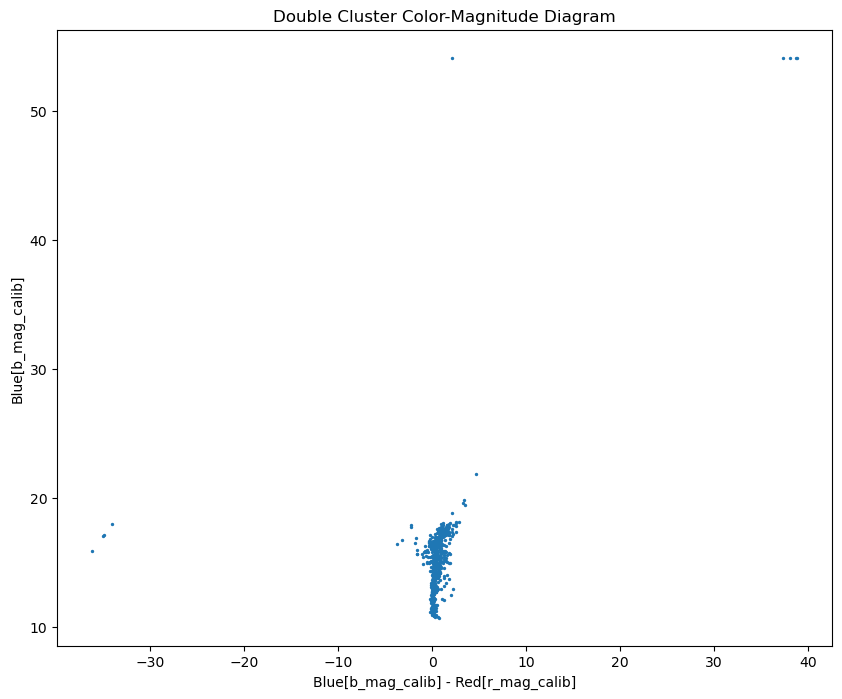

In [57]:
#plot a color-magnitude diagram of Red_mag vs Blue_mag-Red_mag
plt.figure(figsize=(10,8))
plt.scatter(blue_final['b_mag_calib'] - red_final['r_mag_calib'], red_final['b_mag_calib'], s=2)
plt.xlabel("Blue[b_mag_calib] - Red[r_mag_calib]")
plt.ylabel("Blue[b_mag_calib]")
plt.title("Double Cluster Color-Magnitude Diagram")

#plt.xlim(-5,5)
#plt.ylim(18,8)

In [58]:
#cut out outlier stars in "y" direction
bind = np.where(blue_final['r_mag_calib']<20)
rind = np.where(red_final['r_mag_calib']<20)
blue_final = blue_final[bind]
red_final = red_final[rind]

#cut out outlier stars in "x" direction
bind2 = np.where(blue_final['b_mag_calib']-blue_final['r_mag_calib'] < 20)
rind2 = np.where(red_final['b_mag_calib']-red_final['r_mag_calib'] < 20)
blue_final = blue_final[bind2]
red_final = red_final[rind2]

Text(0.5, 1.0, 'Double Cluster Color-Magnitude Diagram')

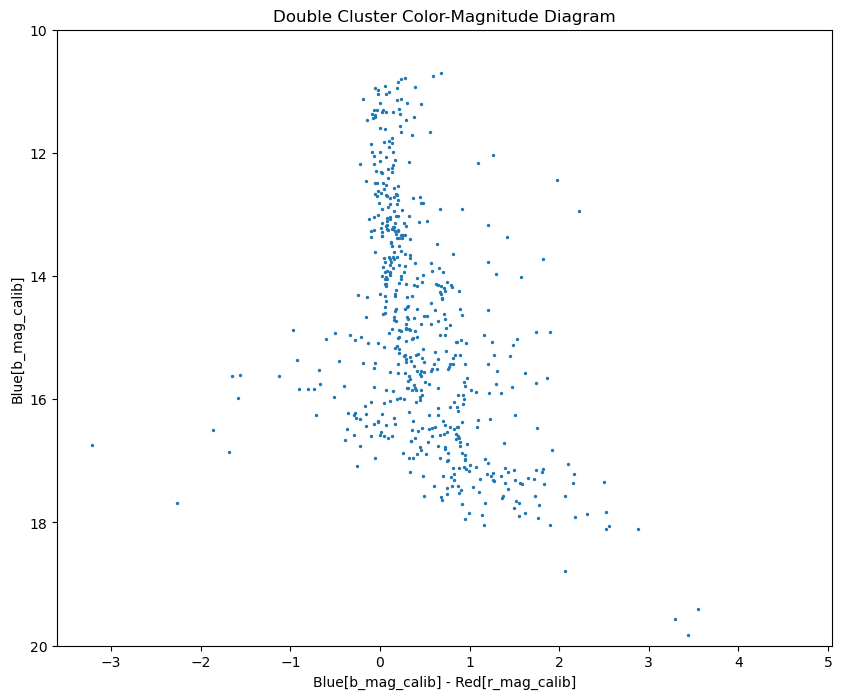

In [59]:
#re-plot CM diagram without outlier stars
plt.figure(figsize=(10,8))
plt.scatter(blue_final['b_mag_calib'] - red_final['r_mag_calib'], red_final['b_mag_calib'], s=2)
plt.xlabel("Blue[b_mag_calib] - Red[r_mag_calib]")
plt.ylabel("Blue[b_mag_calib]")
plt.ylim(20,10)
plt.title("Double Cluster Color-Magnitude Diagram")

# 6. Fit isochrone

In [60]:
#define the column names of the blue and red filters in the table of observed stars
catnames = ['b_mag_calib','r_mag_calib']

#use the SDSS data (in blue=gmag and red=rmag filters) to create isochrone model
isonames = ['SDSS_GMAG','SDSS_RMAG']

In [61]:
#fit isochrone with no restrictions
out,bestiso = chronos.fit(blue_final,catnames=catnames,isonames=isonames,verbose=True)

Fitting isochrones to catalog of 567 sources
Photometry columns: b_mag_calib, r_mag_calib
Isochrone columns: SDSS_GMAG, SDSS_RMAG
 
Performing grid search
 
Performing maximum likelihood estimation
Age    =  500000000.00 +/- 110864073.828 years
Metal  =     -0.49 +/-  0.197 dex  
Extinction =      1.26 +/-    nan      
Distmod =     10.26 +/-    nan      
 
Final parameters:
Age    =  500000000.00 +/- 110864073.828 years
Metal  =     -0.49 +/-  0.197 dex  
Extinction =      1.26 +/-    nan      
Distmod =     10.26 +/-    nan      
chisq = 133.38


In [62]:
#fit isochrone forcing a young age (since previous literature suggests the Double Cluster is very young)
out2, bestiso2 = chronos.fit(blue_final,catnames=catnames,isonames=isonames,verbose=True, ages=np.linspace(0.1, 0.3, 6)*1e9)

Fitting isochrones to catalog of 567 sources
Photometry columns: b_mag_calib, r_mag_calib
Isochrone columns: SDSS_GMAG, SDSS_RMAG
 
Performing grid search
 
Performing maximum likelihood estimation
Age    =  100000000.00 +/-    nan years
Metal  =     -0.50 +/-    nan dex  
Extinction =      1.00 +/-  0.109      
Distmod =     10.00 +/-  0.117      
 
Final parameters:
Age    =  100000000.00 +/-    nan years
Metal  =     -0.50 +/-    nan dex  
Extinction =      1.00 +/-  0.109      
Distmod =     10.00 +/-  0.117      
chisq = 125.32


(20.0, 8.0)

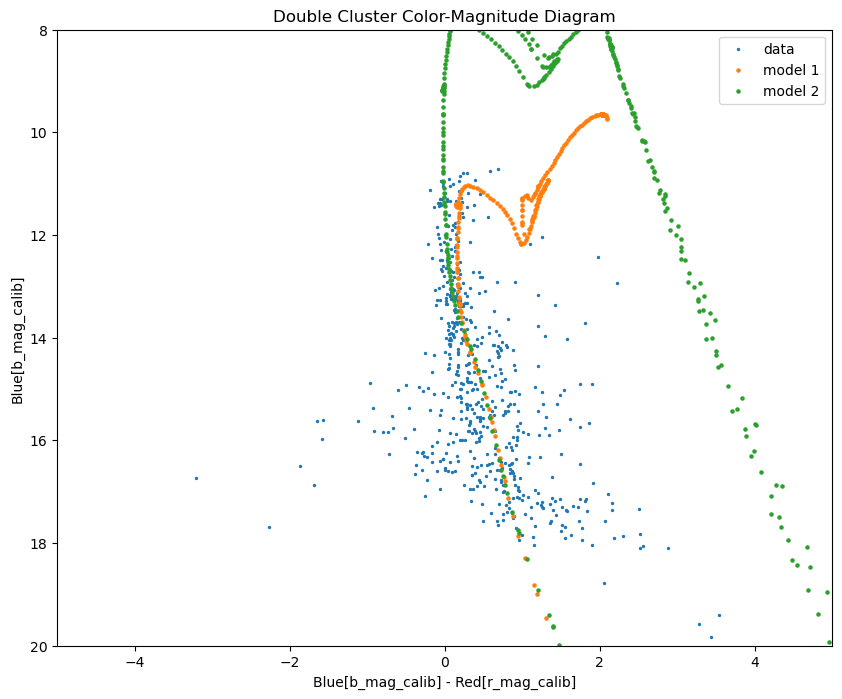

In [63]:
#plot the 2 isochrone models over the observed data's CM diagram
plt.figure(figsize=(10,8))
plt.scatter(blue_final['b_mag_calib'] - red_final['r_mag_calib'], red_final['b_mag_calib'], s=2, label="data")

plt.scatter(bestiso["SDSS_GMAG"]-bestiso["SDSS_RMAG"], bestiso["SDSS_GMAG"], s=5, label="model 1")
plt.scatter(bestiso2["SDSS_GMAG"]-bestiso2["SDSS_RMAG"], bestiso2["SDSS_GMAG"], s=5, label="model 2")

plt.xlabel("Blue[b_mag_calib] - Red[r_mag_calib]")
plt.ylabel("Blue[b_mag_calib]")
plt.title("Double Cluster Color-Magnitude Diagram")
plt.legend()

plt.xlim(-5,5)
plt.ylim(20,8)

In [64]:
#It looks like model 2 (with the forced younger age) is a better fit, both visually and with a smaller chi-square value
final_isochrone_model = bestiso2
final_isochrone_model

Isochrone
Age = 1.000e+08 years
Metallicity = -0.500
Distance Modulus = 10.000
Extinction =  1.000
Nbands = 29

(20.0, 8.0)

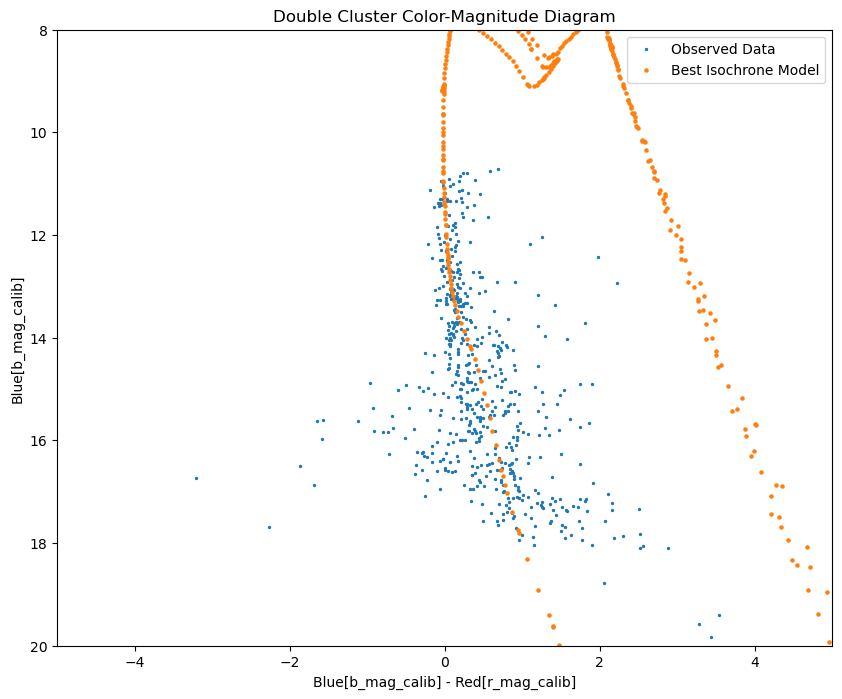

In [65]:
plt.figure(figsize=(10,8))
plt.scatter(blue_final['b_mag_calib'] - red_final['r_mag_calib'], red_final['b_mag_calib'], s=2, label="Observed Data")
plt.scatter(bestiso2["SDSS_GMAG"]-bestiso2["SDSS_RMAG"], bestiso2["SDSS_GMAG"], s=5, label="Best Isochrone Model")

plt.xlabel("Blue[b_mag_calib] - Red[r_mag_calib]")
plt.ylabel("Blue[b_mag_calib]")
plt.title("Double Cluster Color-Magnitude Diagram")
plt.legend()

plt.xlim(-5,5)
plt.ylim(20,8)